# *Step* 1: Set Up Environment

In [ ]:
!pip install torch torchvision matplotlib opencv-python-headless pytesseract
!sudo apt-get install tesseract-ocr


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,666 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

# Step 2: Download and Prepare Dataset

In [ ]:
!wget -O sku110k.zip https://github.com/eg4000/SKU110K_CVPR19/archive/refs/heads/master.zip
!unzip sku110k.zip -d ./data/


--2024-12-10 22:52:06--  https://github.com/eg4000/SKU110K_CVPR19/archive/refs/heads/master.zip
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/eg4000/SKU110K_CVPR19/zip/refs/heads/master [following]
--2024-12-10 22:52:06--  https://codeload.github.com/eg4000/SKU110K_CVPR19/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.112.9
Connecting to codeload.github.com (codeload.github.com)|140.82.112.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘sku110k.zip’

sku110k.zip             [     <=>            ]  17.82M  17.1MB/s    in 1.0s    

2024-12-10 22:52:08 (17.1 MB/s) - ‘sku110k.zip’ saved [18681440]

Archive:  sku110k.zip
1fb83d6d0e5fd0fef8d53d25940ebd6f8d027020
   creating: ./data/SKU110K_CVPR19-master/
  inflating: ./data/SKU

In [ ]:
!ls -ltr ./data/SKU110K_CVPR19-master

total 15436
-rw-r--r-- 1 root root 3344067 Oct 20  2020  Supplementary_Material__Precise_Detection_in_Densely_Packed_Scenes.pdf
drwxr-xr-x 2 root root    4096 Oct 20  2020  snapshots
-rw-r--r-- 1 root root     123 Oct 20  2020  requirements.txt
-rw-r--r-- 1 root root    7542 Oct 20  2020  README.md
-rw-r--r-- 1 root root 3351007 Oct 20  2020  Poster.pdf
-rw-r--r-- 1 root root   56881 Oct 20  2020  Pipfile.lock
-rw-r--r-- 1 root root     246 Oct 20  2020  Pipfile
-rw-r--r-- 1 root root 9017383 Oct 20  2020 'Object Recognition in retail - AI week 2019 presentation.pdf'
drwxr-xr-x 3 root root    4096 Oct 20  2020  object_detector_retinanet
drwxr-xr-x 2 root root    4096 Oct 20  2020  figures


In [ ]:
!ls -ltr ./data/SKU110K_CVPR19-master/figures

total 3460
-rw-r--r-- 1 root root  981723 Oct 20  2020 teaser_width.jpg
-rw-r--r-- 1 root root  446529 Oct 20  2020 teaser.jpg
-rw-r--r-- 1 root root 1155452 Oct 20  2020 system.jpg
-rw-r--r-- 1 root root  465038 Oct 20  2020 qualitative.jpg
-rw-r--r-- 1 root root  483250 Oct 20  2020 benchmarks_comparison.jpg


In [ ]:
!pip install gdown


In [ ]:
!gdown --id 1iq93lCdhaPUN0fWbLieMtzfB1850pKwd -O ./SKU110K.zip


/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1iq93lCdhaPUN0fWbLieMtzfB1850pKwd
From (redirected): https://drive.google.com/uc?id=1iq93lCdhaPUN0fWbLieMtzfB1850pKwd&confirm=t&uuid=6f13a53d-1638-4717-847f-c0c6325287e4
To: /content/SKU110K.zip
100% 12.2G/12.2G [03:10<00:00, 64.0MB/s]


In [ ]:
!ls -ltr

total 11928564
-rw-r--r-- 1 root root 12196152718 Dec 18  2019 SKU110K.zip
drwxr-xr-x 1 root root        4096 Dec  9 14:20 sample_data
-rw-r--r-- 1 root root    18681440 Dec 10 22:52 sku110k.zip
drwxr-xr-x 3 root root        4096 Dec 10 22:52 data


In [ ]:
# !unzip ./SKU110K.zip -d ./data/sku110k/
!mkdir -p ./data/sku110k/
!tar -xvzf SKU110K.zip -C ./data/sku110k/



Streaming output truncated to the last 5000 lines.
SKU110K_fixed/images/train_2529.jpg
SKU110K_fixed/images/test_1599.jpg
SKU110K_fixed/images/train_268.jpg
SKU110K_fixed/images/test_2667.jpg
SKU110K_fixed/images/val_510.jpg
SKU110K_fixed/images/val_5.jpg
SKU110K_fixed/images/train_2623.jpg
SKU110K_fixed/images/train_2118.jpg
SKU110K_fixed/images/test_1188.jpg
SKU110K_fixed/images/train_1523.jpg
SKU110K_fixed/images/test_2256.jpg
SKU110K_fixed/images/test_1661.jpg
SKU110K_fixed/images/train_330.jpg
SKU110K_fixed/images/test_789.jpg
SKU110K_fixed/images/train_1112.jpg
SKU110K_fixed/images/train_399.jpg
SKU110K_fixed/images/test_2798.jpg
SKU110K_fixed/images/test_1250.jpg
SKU110K_fixed/images/train_7892.jpg
SKU110K_fixed/images/test_378.jpg
SKU110K_fixed/images/train_7387.jpg
SKU110K_fixed/images/test_5.jpg
SKU110K_fixed/images/train_6381.jpg
SKU110K_fixed/images/test_851.jpg
SKU110K_fixed/images/test_1792.jpg
SKU110K_fixed/images/train_7481.jpg
SKU110K_fixed/images/train_4828.jpg
SKU110

In [ ]:
!ls -ltr ./data/sku110k/SKU110K_fixed/images


Streaming output truncated to the last 5000 lines.
-rwxrwxrwx 1 1001 1001 1146141 Mar 12  2019 train_6844.jpg
-rwxrwxrwx 1 1001 1001  858305 Mar 12  2019 train_6843.jpg
-rwxrwxrwx 1 1001 1001  649870 Mar 12  2019 train_6842.jpg
-rwxrwxrwx 1 1001 1001  596698 Mar 12  2019 train_6841.jpg
-rwxrwxrwx 1 1001 1001 1094894 Mar 12  2019 train_6840.jpg
-rwxrwxrwx 1 1001 1001 1151611 Mar 12  2019 train_6839.jpg
-rwxrwxrwx 1 1001 1001  631907 Mar 12  2019 train_6838.jpg
-rwxrwxrwx 1 1001 1001 1003646 Mar 12  2019 train_6837.jpg
-rwxrwxrwx 1 1001 1001 1756592 Mar 12  2019 train_6836.jpg
-rwxrwxrwx 1 1001 1001  634248 Mar 12  2019 train_6835.jpg
-rwxrwxrwx 1 1001 1001  593712 Mar 12  2019 train_6834.jpg
-rwxrwxrwx 1 1001 1001  784422 Mar 12  2019 train_6833.jpg
-rwxrwxrwx 1 1001 1001  541115 Mar 12  2019 train_6832.jpg
-rwxrwxrwx 1 1001 1001  582637 Mar 12  2019 train_6831.jpg
-rwxrwxrwx 1 1001 1001 2040610 Mar 12  2019 train_6830.jpg
-rwxrwxrwx 1 1001 1001  656070 Mar 12  2019 train_6829.jpg
-rwxr

# Step 3. Validate and Fix Annotations

In [ ]:
!ls -ltr ./data/sku110k/SKU110K_fixed/annotations

total 84480
-rwxrwxrwx 1 1001 1001       74 Dec 18  2019 readme.txt
-rwxrwxrwx 1 1001 1001 60955824 Dec 18  2019 annotations_train.csv
-rwxrwxrwx 1 1001 1001  4310398 Dec 18  2019 annotations_val.csv
-rwxrwxrwx 1 1001 1001 21233656 Dec 18  2019 annotations_test.csv


In [ ]:
import pandas as pd

annotations_path = './data/sku110k/SKU110K_fixed/annotations/annotations_train.csv'
annotations = pd.read_csv(annotations_path)
print(annotations.head())


   train_0.jpg   208   537   422   814  object  3024  3024.1
0  train_0.jpg  1268  1923  1365  2209  object  3024    3024
1  train_0.jpg  1135  2074  1261  2166  object  3024    3024
2  train_0.jpg  1045  2085  1122  2258  object  3024    3024
3  train_0.jpg   976  2036  1040  2177  object  3024    3024
4  train_0.jpg   863  2048   937  2194  object  3024    3024


In [ ]:
# Define column headers based on observation
columns = ['image_id', 'x_min', 'y_min', 'x_max', 'y_max', 'class', 'width', 'height']

# Reload annotations with column headers
annotations = pd.read_csv(annotations_path, names=columns)
print(annotations.head())


      image_id  x_min  y_min  x_max  y_max   class  width  height
0  train_0.jpg    208    537    422    814  object   3024    3024
1  train_0.jpg   1268   1923   1365   2209  object   3024    3024
2  train_0.jpg   1135   2074   1261   2166  object   3024    3024
3  train_0.jpg   1045   2085   1122   2258  object   3024    3024
4  train_0.jpg    976   2036   1040   2177  object   3024    3024


In [ ]:
# Check for NaN or invalid bounding box values
invalid_boxes = annotations[
    (annotations['x_min'] < 0) |
    (annotations['y_min'] < 0) |
    (annotations['x_max'] > annotations['width']) |
    (annotations['y_max'] > annotations['height'])
]
print(f"Number of invalid boxes: {len(invalid_boxes)}")


Number of invalid boxes: 14918


In [ ]:
invalid_boxes = annotations[
    (annotations['x_min'] < 0) |
    (annotations['y_min'] < 0) |
    (annotations['x_max'] > annotations['width']) |
    (annotations['y_max'] > annotations['height'])
]
print(invalid_boxes.head())


            image_id  x_min  y_min  x_max  y_max   class  width  height
70       train_0.jpg   2850   2290   3027   2732  object   3024    3024
429     train_10.jpg   2355   2674   2449   2710  object   2448    3264
656   train_1000.jpg     53   2851    152   3265  object   2448    3264
1043  train_1003.jpg   2275   3029   2341   3332  object   2340    4160
1048  train_1003.jpg   2279   1900   2344   2218  object   2340    4160


In [ ]:
# Fix bounding boxes by clipping to valid ranges
annotations['x_min'] = annotations['x_min'].clip(lower=0, upper=annotations['width'])
annotations['y_min'] = annotations['y_min'].clip(lower=0, upper=annotations['height'])
annotations['x_max'] = annotations['x_max'].clip(lower=0, upper=annotations['width'])
annotations['y_max'] = annotations['y_max'].clip(lower=0, upper=annotations['height'])

# Remove boxes where x_min >= x_max or y_min >= y_max
annotations_cleaned = annotations[
    (annotations['x_min'] < annotations['x_max']) &
    (annotations['y_min'] < annotations['y_max'])
]

print(f"Number of valid annotations after cleaning: {len(annotations_cleaned)}")


Number of valid annotations after cleaning: 1208482


In [ ]:
annotations_cleaned.to_csv('./data/sku110k/SKU110K_fixed/annotations_cleaned_train.csv', index=False)


In [ ]:
invalid_boxes = annotations_cleaned[
    (annotations_cleaned['x_min'] < 0) |
    (annotations_cleaned['y_min'] < 0) |
    (annotations_cleaned['x_max'] > annotations_cleaned['width']) |
    (annotations_cleaned['y_max'] > annotations_cleaned['height'])
]
print(f"Remaining invalid boxes: {len(invalid_boxes)}")


Remaining invalid boxes: 0


In [ ]:
print(annotations_cleaned.head())


      image_id  x_min  y_min  x_max  y_max   class  width  height
0  train_0.jpg    208    537    422    814  object   3024    3024
1  train_0.jpg   1268   1923   1365   2209  object   3024    3024
2  train_0.jpg   1135   2074   1261   2166  object   3024    3024
3  train_0.jpg   1045   2085   1122   2258  object   3024    3024
4  train_0.jpg    976   2036   1040   2177  object   3024    3024


# Step 4. Define Dataset

In [ ]:
import torch
import torchvision
from torchvision.transforms import functional as F
import os
from PIL import Image
import pandas as pd

class SKU110KDataset(torch.utils.data.Dataset):
    def __init__(self, root, annotations_file, transforms=None):
        self.root = root
        self.transforms = transforms
        self.annotations = pd.read_csv(annotations_file)
        self.imgs = sorted(self.annotations['image_id'].unique())  # Unique image IDs

    def __getitem__(self, idx):
        # Get the image file path
        img_name = self.imgs[idx]
        img_path = os.path.join(self.root, "images", img_name)
        img = Image.open(img_path).convert("RGB")

        # Get all bounding boxes for the current image
        records = self.annotations[self.annotations['image_id'] == img_name]
        boxes = records[['x_min', 'y_min', 'x_max', 'y_max']].values.tolist()
        labels = [1] * len(boxes)  # Assuming one class "object" for simplicity

        target = {
            "boxes": torch.as_tensor(boxes, dtype=torch.float32),
            "labels": torch.as_tensor(labels, dtype=torch.int64)
        }

        # Apply image transformations
        if self.transforms:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

# Define transforms
def get_transform():
    return torchvision.transforms.Compose([
        torchvision.transforms.ToTensor()
    ])


In [ ]:
# Paths
root = "./data/sku110k/SKU110K_fixed/"
annotations_file = os.path.join(root, "annotations_cleaned_train.csv")

# Dataset and DataLoader
dataset = SKU110KDataset(root, annotations_file, transforms=get_transform())
data_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=2,  # Adjust based on GPU memory
    shuffle=True,
    collate_fn=lambda x: tuple(zip(*x))
)

# Verify DataLoader
for imgs, targets in data_loader:
    print(f"Number of images in batch: {len(imgs)}")
    print(f"First image shape: {imgs[0].shape}")
    print(f"First target: {targets[0]}")
    break


Number of images in batch: 2
First image shape: torch.Size([3, 3264, 2448])
First target: {'boxes': tensor([[2320., 2355., 2448., 2454.],
        [ 517., 2234.,  782., 2419.],
        [  99., 2453.,  198., 2737.],
        [2277., 2477., 2376., 2681.],
        [ 274., 2243.,  523., 2408.],
        [   8., 2244.,  145., 2408.],
        [1329., 1210., 1460., 1496.],
        [ 179., 1899.,  255., 2168.],
        [ 256., 1903.,  332., 2171.],
        [ 332., 1910.,  414., 2178.],
        [ 208., 2457.,  325., 2737.],
        [ 514., 1935.,  598., 2171.],
        [ 318., 2453.,  417., 2726.],
        [ 603., 1936.,  686., 2178.],
        [ 412., 2458.,  523., 2744.],
        [ 149., 2250.,  276., 2415.],
        [ 414., 1933.,  513., 2175.],
        [1084., 2229., 1238., 2405.],
        [2172., 2472., 2281., 2712.],
        [2022., 2473., 2132., 2631.],
        [ 521., 2454.,  626., 2734.],
        [ 633., 2499.,  725., 2716.],
        [ 731., 2465.,  810., 2670.],
        [ 812., 2525.,  89

# Step 5: Train Object Detection Model

In [ ]:
import os
import torch
import pandas as pd
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from torchvision.transforms import Compose, ToTensor
from PIL import Image

# Step 1: Resize images to 1024x1024
input_dir = "./data/sku110k/SKU110K_fixed/images/"
output_dir = "./data/sku110k/SKU110K_fixed/images_resized/"
os.makedirs(output_dir, exist_ok=True)

# Limit to 100 images
resized_images = []
for img_name in os.listdir(input_dir)[:100]:
    img_path = os.path.join(input_dir, img_name)
    img = Image.open(img_path)
    img = img.resize((1024, 1024))
    img.save(os.path.join(output_dir, img_name))
    resized_images.append(img_name)

# Step 2: Filter annotations to match resized images
annotations_file = "./data/sku110k/SKU110K_fixed/annotations_cleaned_train.csv"
annotations = pd.read_csv(annotations_file)
annotations_filtered = annotations[annotations['image_id'].isin(resized_images)]

# Save filtered annotations
filtered_annotations_path = "./data/sku110k/SKU110K_fixed/annotations_filtered_train.csv"
annotations_filtered.to_csv(filtered_annotations_path, index=False)

# Step 3: Define Dataset Class
class SKU110KDataset(torch.utils.data.Dataset):
    def __init__(self, root, annotations_file, transforms=None):
        self.root = root
        self.transforms = transforms
        self.annotations = pd.read_csv(annotations_file)
        self.imgs = sorted(self.annotations['image_id'].unique())

    def __getitem__(self, idx):
        img_name = self.imgs[idx]
        img_path = os.path.join(self.root, img_name)
        img = Image.open(img_path).convert("RGB")
        records = self.annotations[self.annotations['image_id'] == img_name]
        boxes = records[['x_min', 'y_min', 'x_max', 'y_max']].values.tolist()
        labels = [1] * len(boxes)  # Single class: 'object'
        target = {"boxes": torch.as_tensor(boxes, dtype=torch.float32), "labels": torch.as_tensor(labels, dtype=torch.int64)}
        if self.transforms:
            img = self.transforms(img)
        return img, target

    def __len__(self):
        return len(self.imgs)

# Step 4: Define transforms and DataLoader
def get_transform():
    return Compose([ToTensor()])

dataset = SKU110KDataset(output_dir, filtered_annotations_path, transforms=get_transform())
data_loader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Step 5: Load Faster R-CNN model
model = fasterrcnn_resnet50_fpn(weights="DEFAULT")  # Updated for weights deprecation
num_classes = 2  # 1 object class + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Step 6: Training
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model.to(device)

# Updated Learning Rate and Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Training Loop with Gradient Clipping
num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    for batch_idx, (imgs, targets) in enumerate(data_loader):
        imgs = [img.to(device) for img in imgs]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(imgs, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Check for NaN losses
        if torch.isnan(losses):
            print(f"NaN loss detected at batch {batch_idx + 1}")
            continue

        # Backward pass with gradient clipping
        optimizer.zero_grad()
        losses.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        epoch_loss += losses.item()
        print(f"Processed batch {batch_idx + 1}/{len(data_loader)} - Loss: {losses.item():.4f}")
    lr_scheduler.step()
    print(f"Epoch {epoch + 1}, Total Loss: {epoch_loss:.4f}")



Processed batch 1/74 - Loss: 28.5432
Processed batch 2/74 - Loss: 49.3109
Processed batch 3/74 - Loss: 21.3290
Processed batch 4/74 - Loss: 57.0579
Processed batch 5/74 - Loss: 30.4357
Processed batch 6/74 - Loss: 33.6665
Processed batch 7/74 - Loss: 23.2163
Processed batch 8/74 - Loss: 64.7864
Processed batch 9/74 - Loss: 75.4230
Processed batch 10/74 - Loss: 44.7537
Processed batch 11/74 - Loss: 22.0338
Processed batch 12/74 - Loss: 17.5199
Processed batch 13/74 - Loss: 19.0678
Processed batch 14/74 - Loss: 23.7278
Processed batch 15/74 - Loss: 13.4097
Processed batch 16/74 - Loss: 41.8133
Processed batch 17/74 - Loss: 17.7736
Processed batch 18/74 - Loss: 54.3962
Processed batch 19/74 - Loss: 30.2801
Processed batch 20/74 - Loss: 36.7299
Processed batch 21/74 - Loss: 35.7391
Processed batch 22/74 - Loss: 17.9911
Processed batch 23/74 - Loss: 56.2867
Processed batch 24/74 - Loss: 14.6406
Processed batch 25/74 - Loss: 94.7148
Processed batch 26/74 - Loss: 82.2012
Processed batch 27/74

# Step 6. Test Prediciton

In [ ]:
from torch.utils.data import random_split, DataLoader

# Step 7: Split Dataset into Training and Validation
train_size = int(0.8 * len(dataset))  # 80% for training
val_size = len(dataset) - train_size  # 20% for validation
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# DataLoaders for training and validation
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Step 8: Evaluate Model on Validation Data
model.eval()  # Set model to evaluation mode

# Evaluate on a single batch for inspection
with torch.no_grad():
    for imgs, targets in val_loader:
        imgs = [img.to(device) for img in imgs]
        outputs = model(imgs)  # Get predictions
        for i, output in enumerate(outputs):
            print(f"Image {i+1}:")
            print(f"Predicted Boxes: {output['boxes']}")
            print(f"Scores: {output['scores']}")
            print(f"Labels: {output['labels']}")
        break  # Process only one batch for visualization


Image 1:
Predicted Boxes: tensor([[ 752.0040,  945.8285,  839.0540, 1023.3029],
        [ 749.5583,  875.0283,  857.5809, 1024.0000],
        [ 685.9324,  900.5366,  770.2668, 1024.0000],
        [ 514.2337,  176.4978,  633.8631,  435.4033],
        [ 610.2539,  151.9575,  730.4523,  448.5504],
        [ 436.5996,  136.5860,  549.8984,  394.7353],
        [ 732.2342,  784.6650, 1005.8662, 1017.6455],
        [ 460.7998,  188.4184,  583.7230,  422.6588],
        [ 186.5506,  254.6512,  286.3293,  454.7628],
        [ 564.0646,  169.1287,  688.0668,  443.8478],
        [ 693.5341,  186.6261,  787.5236,  422.9473],
        [ 944.0544,  742.2031, 1024.0000,  924.4631],
        [ 661.5541,  950.0524,  761.1295, 1024.0000],
        [ 578.8110,  169.7346,  818.7772,  478.9276],
        [ 500.4172,  132.5994,  609.3545,  328.7279],
        [ 841.6829,  804.1530,  966.0391, 1024.0000],
        [ 480.4396,  140.1945,  672.2815,  547.5189],
        [ 422.7274,  212.3425,  622.1222,  529.9413],
  

In [ ]:
# Switch to evaluation mode
model.eval()

# Evaluate on the validation dataset
with torch.no_grad():
    for imgs, targets in val_loader:
        imgs = [img.to(device) for img in imgs]
        outputs = model(imgs)  # Get predictions
        print(f"Predictions: {outputs}")
        break  # Print for one image


Predictions: [{'boxes': tensor([[ 752.0040,  945.8285,  839.0540, 1023.3029],
        [ 749.5583,  875.0283,  857.5809, 1024.0000],
        [ 685.9324,  900.5366,  770.2668, 1024.0000],
        [ 514.2337,  176.4978,  633.8631,  435.4033],
        [ 610.2539,  151.9575,  730.4523,  448.5504],
        [ 436.5996,  136.5860,  549.8984,  394.7353],
        [ 732.2342,  784.6650, 1005.8662, 1017.6455],
        [ 460.7998,  188.4184,  583.7230,  422.6588],
        [ 186.5506,  254.6512,  286.3293,  454.7628],
        [ 564.0646,  169.1287,  688.0668,  443.8478],
        [ 693.5341,  186.6261,  787.5236,  422.9473],
        [ 944.0544,  742.2031, 1024.0000,  924.4631],
        [ 661.5541,  950.0524,  761.1295, 1024.0000],
        [ 578.8110,  169.7346,  818.7772,  478.9276],
        [ 500.4172,  132.5994,  609.3545,  328.7279],
        [ 841.6829,  804.1530,  966.0391, 1024.0000],
        [ 480.4396,  140.1945,  672.2815,  547.5189],
        [ 422.7274,  212.3425,  622.1222,  529.9413],
    

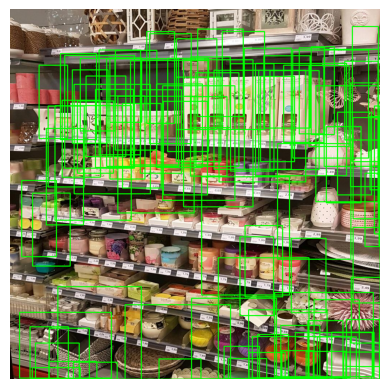

In [ ]:
import matplotlib.pyplot as plt
import cv2

def visualize_predictions(img, outputs):
    img = img.permute(1, 2, 0).cpu().numpy()  # Convert tensor to numpy array
    img = (img * 255).astype("uint8")
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    # Draw predicted bounding boxes
    for box in outputs[0]['boxes']:
        x1, y1, x2, y2 = map(int, box.tolist())
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Visualize for one validation image
with torch.no_grad():
    imgs, targets = next(iter(val_loader))
    imgs = [img.to(device) for img in imgs]
    outputs = model(imgs)
    visualize_predictions(imgs[0], outputs)


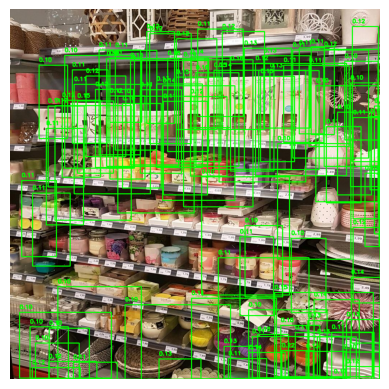

In [ ]:
import matplotlib.pyplot as plt
import cv2

def visualize_predictions(img, outputs, threshold=0.1):
    img = img.permute(1, 2, 0).cpu().numpy()  # Convert tensor to numpy array
    img = (img * 255).astype("uint8")
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    # Draw predicted bounding boxes
    for box, score in zip(outputs[0]['boxes'], outputs[0]['scores']):
        if score > threshold:  # Adjust confidence threshold
            x1, y1, x2, y2 = map(int, box.tolist())
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, f"{score:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Visualize for one validation image
with torch.no_grad():
    imgs, targets = next(iter(val_loader))
    imgs = [img.to(device) for img in imgs]
    outputs = model(imgs)
    visualize_predictions(imgs[0], outputs, threshold=0.1)  # Set a low threshold


In [ ]:
torch.save(model.state_dict(), "faster_rcnn_sku110k.pth")
print("Model saved successfully.")


Model saved successfully.


# Step 7. Apply nms

In [ ]:
from torchvision.ops import nms
import torch

def apply_nms(outputs, iou_threshold=0.3):
    boxes = outputs[0]['boxes']
    scores = outputs[0]['scores']

    # Perform NMS
    keep_indices = nms(boxes, scores, iou_threshold)

    # Filter predictions
    outputs[0]['boxes'] = boxes[keep_indices]
    outputs[0]['scores'] = scores[keep_indices]
    return outputs


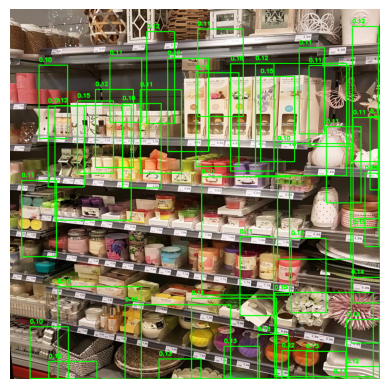

In [ ]:
# Visualize with NMS applied
with torch.no_grad():
    imgs, targets = next(iter(val_loader))
    imgs = [img.to(device) for img in imgs]
    outputs = model(imgs)

    # Apply Non-Maximum Suppression
    outputs = apply_nms(outputs, iou_threshold=0.3)  # Adjust IoU threshold as needed
    visualize_predictions(imgs[0], outputs, threshold=0.1)


In [ ]:
torch.save(model.state_dict(), "faster_rcnn_sku110k_nms.pth")
print("Model saved successfully.")

Model saved successfully.


In [ ]:
!wget -O ./data/sample_test_image.jpg "https://upload.wikimedia.org/wikipedia/commons/9/97/12-04-20-saucen-by-RalfR-15.jpg"


--2024-12-10 23:15:51--  https://upload.wikimedia.org/wikipedia/commons/9/97/12-04-20-saucen-by-RalfR-15.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5846435 (5.6M) [image/jpeg]
Saving to: ‘./data/sample_test_image.jpg’

./data/sample_test_ 100%[===================>]   5.58M  1.91MB/s    in 2.9s    

2024-12-10 23:15:55 (1.91 MB/s) - ‘./data/sample_test_image.jpg’ saved [5846435/5846435]



In [ ]:
from PIL import Image

# Load and display the image
img_path = "./data/sample_test_image.jpg"
img = Image.open(img_path)
img.show()


# Part 2, Step 8: Add OCR for Price Tags, using tessaract

In [ ]:
import numpy as np
from pytesseract import image_to_string
import cv2

def detect_and_recognize(model, image_path):
    # Load the image
    img = Image.open(image_path).convert("RGB")
    transform = torchvision.transforms.ToTensor()
    img_tensor = transform(img).to(device)

    # Perform inference
    model.eval()
    with torch.no_grad():
        predictions = model([img_tensor])
        #print('predictions',predictions)

    # Convert to OpenCV format for OCR
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    recognized_items = []
    for box, score in zip(predictions[0]['boxes'], predictions[0]['scores']):
        if score > 0.1:  # Confidence threshold
            x1, y1, x2, y2 = map(int, box.tolist())
            crop = img_cv[y1:y2, x1:x2]  # Crop the bounding box region
            text = image_to_string(crop)  # Apply OCR
            recognized_items.append({"bounding_box": (x1, y1, x2, y2), "text": text})

    return recognized_items

# # Test OCR on a sample image
# image_path = "./data/sample_test_image.jpg"
# results = detect_and_recognize(model, image_path)
# print("OCR Results:", results)


In [ ]:
results = detect_and_recognize(model, "./data/sample_test_image.jpg")
print("OCR Results:", results)


OCR Results: [{'bounding_box': (1184, 940, 1522, 1607), 'text': ' \n\x0c'}, {'bounding_box': (338, 2960, 767, 3240), 'text': '\x0c'}, {'bounding_box': (1587, 762, 1967, 1567), 'text': ' \n\x0c'}, {'bounding_box': (181, 2946, 608, 3240), 'text': ' \n\x0c'}, {'bounding_box': (723, 954, 1055, 1599), 'text': ' \n\x0c'}, {'bounding_box': (2789, 897, 3204, 1748), 'text': ' \n\x0c'}, {'bounding_box': (1300, 916, 1680, 1695), 'text': ' \n\x0c'}, {'bounding_box': (1369, 738, 1789, 1822), 'text': ' \n\x0c'}, {'bounding_box': (3216, 953, 3616, 1721), 'text': ' \n\x0c'}, {'bounding_box': (263, 3042, 665, 3240), 'text': '\x0c'}, {'bounding_box': (2959, 872, 3454, 1885), 'text': ' \n\x0c'}, {'bounding_box': (1989, 599, 2728, 1601), 'text': ' \n\x0c'}, {'bounding_box': (3596, 927, 3949, 1651), 'text': ' \n\n \n\x0c'}, {'bounding_box': (1166, 1208, 1499, 2441), 'text': ' \n\x0c'}, {'bounding_box': (1903, 561, 2259, 1336), 'text': ' \n\x0c'}, {'bounding_box': (3269, 866, 3990, 1939), 'text': 'Pre\n\nce

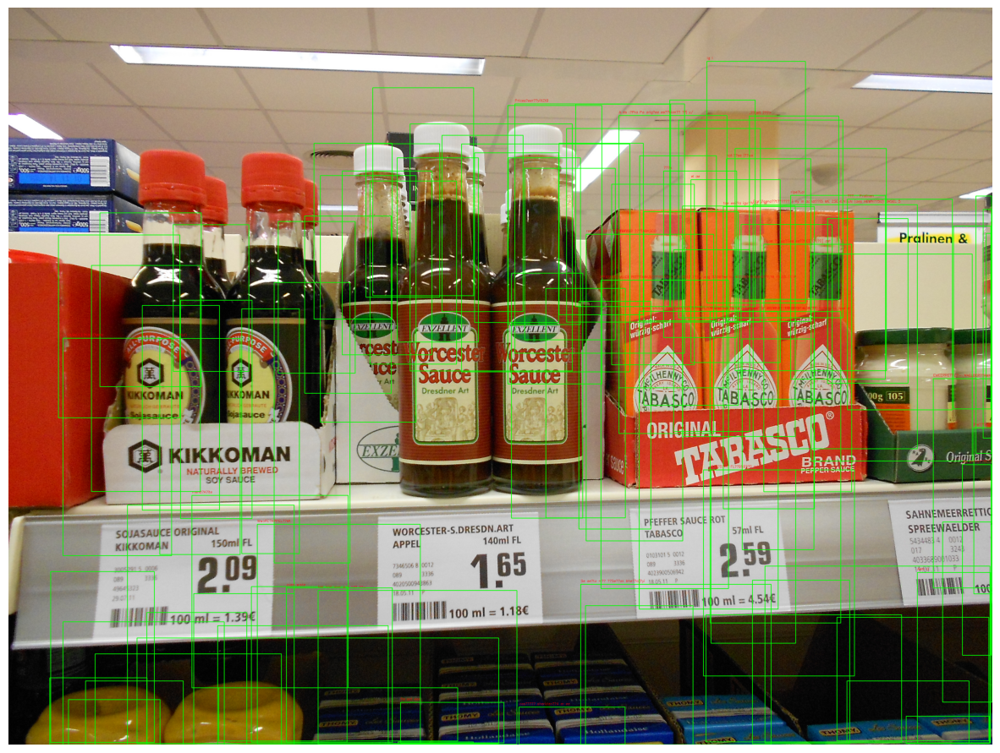

In [ ]:
import matplotlib.pyplot as plt
import cv2

def visualize_ocr_results(image_path, ocr_results):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

    # Draw each bounding box with the OCR text
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        x1, y1, x2, y2 = box

        # Draw the bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Put the OCR text
        cv2.putText(
            img, text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1
        )

    # Display the image
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Visualize OCR results
visualize_ocr_results("./data/sample_test_image.jpg", results)


In [ ]:
# Debugging OCR results
for result in results:
    print(f"Bounding Box: {result['bounding_box']}, Text: {result['text']}")


Bounding Box: (1184, 940, 1522, 1607), Text:  

Bounding Box: (338, 2960, 767, 3240), Text: 
Bounding Box: (1587, 762, 1967, 1567), Text:  

Bounding Box: (181, 2946, 608, 3240), Text:  

Bounding Box: (723, 954, 1055, 1599), Text:  

Bounding Box: (2789, 897, 3204, 1748), Text:  

Bounding Box: (1300, 916, 1680, 1695), Text:  

Bounding Box: (1369, 738, 1789, 1822), Text:  

Bounding Box: (3216, 953, 3616, 1721), Text:  

Bounding Box: (263, 3042, 665, 3240), Text: 
Bounding Box: (2959, 872, 3454, 1885), Text:  

Bounding Box: (1989, 599, 2728, 1601), Text:  

Bounding Box: (3596, 927, 3949, 1651), Text:  

 

Bounding Box: (1166, 1208, 1499, 2441), Text:  

Bounding Box: (1903, 561, 2259, 1336), Text:  

Bounding Box: (3269, 866, 3990, 1939), Text: Pre

cena

t
‘

1} ny in achat

iS ME ZSENGN
uN (aes HEWN

50) BASEL 5

 

Bounding Box: (1763, 511, 2475, 1597), Text:  

Bounding Box: (522, 2187, 1254, 3240), Text:  

Bounding Box: (2504, 1291, 2820, 2292), Text:  



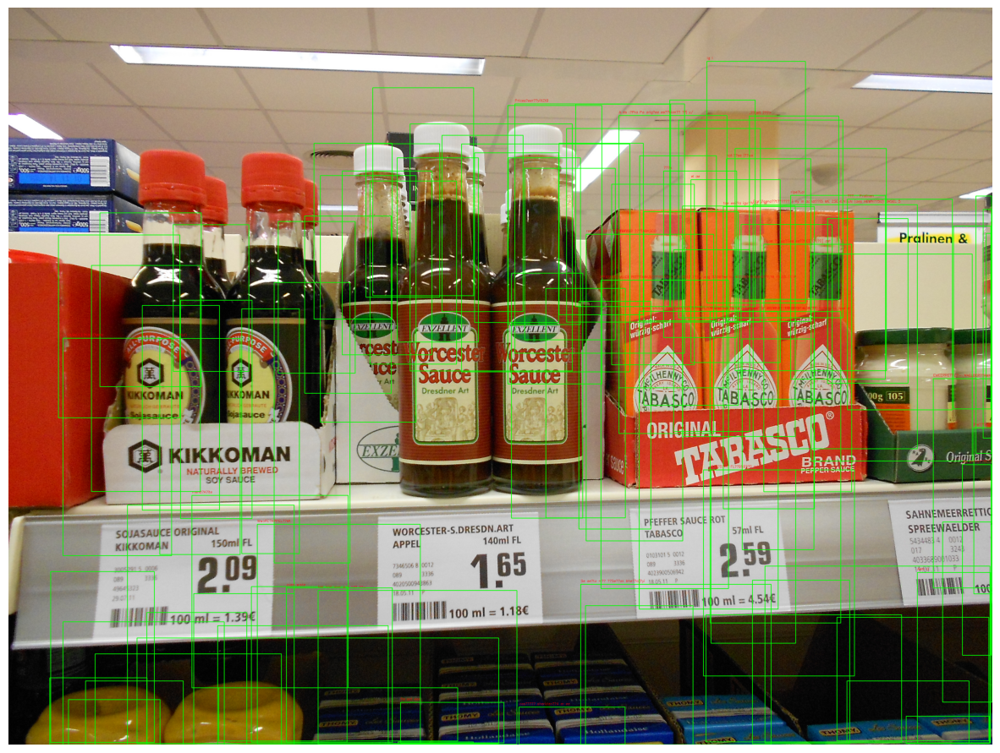

In [ ]:
def visualize_ocr_results_with_text(image_path, ocr_results):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

    # Draw bounding boxes and text
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        x1, y1, x2, y2 = box

        # Draw bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Overlay OCR text
        cv2.putText(
            img, text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1
        )

    # Display the image
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Visualize with OCR text
visualize_ocr_results_with_text("./data/sample_test_image.jpg", results)


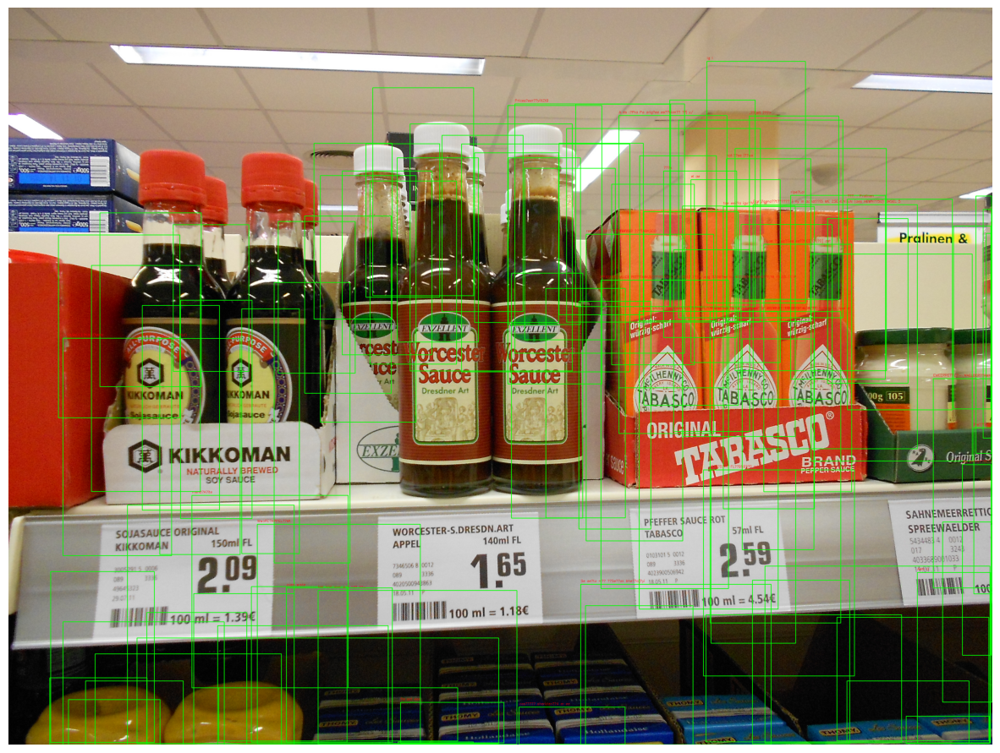

In [ ]:
import matplotlib.pyplot as plt
import cv2

def visualize_all_ocr_results(image_path, ocr_results):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for visualization

    # Draw bounding boxes and text for all results
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        x1, y1, x2, y2 = box

        # Draw the bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Overlay the OCR text
        cv2.putText(
            img, text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1
        )

    # Display the image with all OCR results
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Visualize all OCR results
visualize_all_ocr_results("./data/sample_test_image.jpg", results)


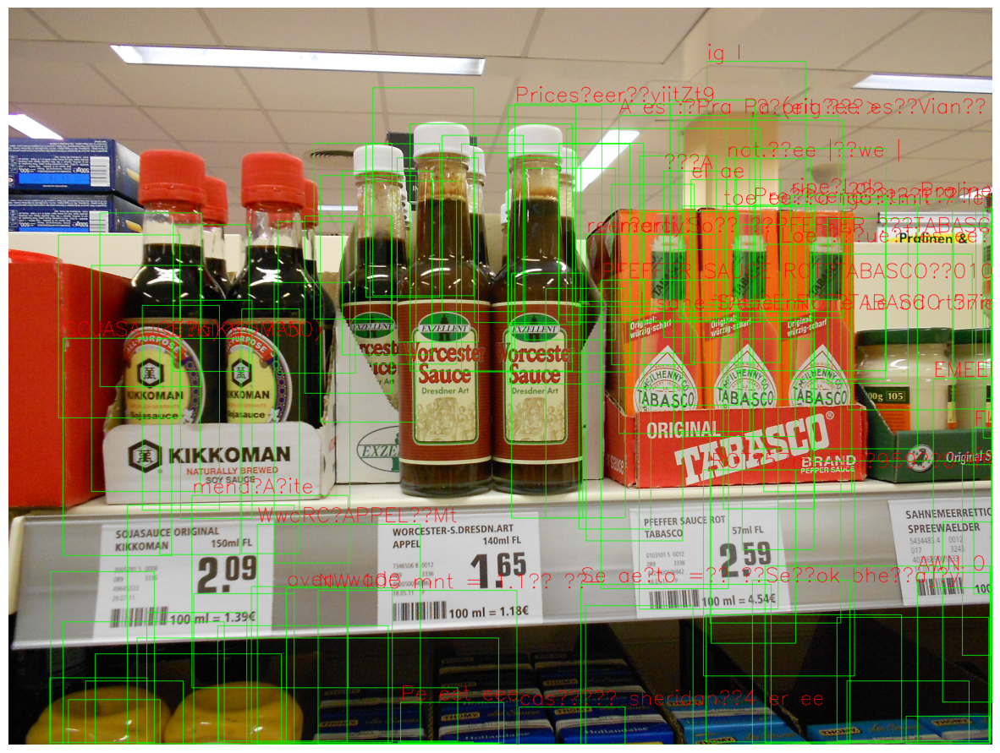

In [ ]:
import matplotlib.pyplot as plt
import cv2

def visualize_all_ocr_results(image_path, ocr_results):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for visualization

    # Draw bounding boxes and text for all results
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        x1, y1, x2, y2 = box

        # Draw the bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Overlay the OCR text with increased font size and thickness
        cv2.putText(
            img, text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=3.0,  # Increased font scale
            color=(255, 0, 0),
            thickness=2  # Increased thickness
        )

    # Display the image with all OCR results
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Visualize all OCR results
visualize_all_ocr_results("./data/sample_test_image.jpg", results)


In [ ]:
print("OCR Results (No Filtering):")
for result in results:
    print(f"Bounding Box: {result['bounding_box']}, Text: {result['text']}")


OCR Results (No Filtering):
Bounding Box: (1184, 940, 1522, 1607), Text:  

Bounding Box: (338, 2960, 767, 3240), Text: 
Bounding Box: (1587, 762, 1967, 1567), Text:  

Bounding Box: (181, 2946, 608, 3240), Text:  

Bounding Box: (723, 954, 1055, 1599), Text:  

Bounding Box: (2789, 897, 3204, 1748), Text:  

Bounding Box: (1300, 916, 1680, 1695), Text:  

Bounding Box: (1369, 738, 1789, 1822), Text:  

Bounding Box: (3216, 953, 3616, 1721), Text:  

Bounding Box: (263, 3042, 665, 3240), Text: 
Bounding Box: (2959, 872, 3454, 1885), Text:  

Bounding Box: (1989, 599, 2728, 1601), Text:  

Bounding Box: (3596, 927, 3949, 1651), Text:  

 

Bounding Box: (1166, 1208, 1499, 2441), Text:  

Bounding Box: (1903, 561, 2259, 1336), Text:  

Bounding Box: (3269, 866, 3990, 1939), Text: Pre

cena

t
‘

1} ny in achat

iS ME ZSENGN
uN (aes HEWN

50) BASEL 5

 

Bounding Box: (1763, 511, 2475, 1597), Text:  

Bounding Box: (522, 2187, 1254, 3240), Text:  

Bounding Box: (2504, 1

# Part 2, Step 9: Add OCR for Price Tags, using easyocr

In [ ]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.9/422.9 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 912.2/912.2 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.8/286.8 kB 24.1 MB/s eta 0:00:00


In [ ]:
import easyocr
import numpy as np
from PIL import Image
import cv2

# Initialize the EasyOCR reader
reader = easyocr.Reader(['en'])  # Use English language for OCR

def detect_and_recognize_with_easyocr(model, image_path):
    """
    Perform object detection and OCR using EasyOCR.
    """
    # Load the image
    img = Image.open(image_path).convert("RGB")
    transform = torchvision.transforms.ToTensor()
    img_tensor = transform(img).to(device)

    # Perform inference
    model.eval()
    with torch.no_grad():
        predictions = model([img_tensor])

    # Convert to OpenCV format for EasyOCR
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    recognized_items = []

    # Iterate over detected bounding boxes
    for box, score in zip(predictions[0]['boxes'], predictions[0]['scores']):
        if score > 0.1:  # Confidence threshold
            x1, y1, x2, y2 = map(int, box.tolist())
            crop = img_cv[y1:y2, x1:x2]  # Crop the bounding box region

            # Apply EasyOCR to the cropped region
            results = reader.readtext(crop)
            text = " ".join([res[1] for res in results])  # Combine all detected text

            # Append the result with bounding box and text
            recognized_items.append({"bounding_box": (x1, y1, x2, y2), "text": text})

    return recognized_items


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
import matplotlib.pyplot as plt
import cv2

def visualize_all_ocr_results(image_path, ocr_results):
    """
    Visualize the detected bounding boxes and their OCR text results on the image.
    """
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for visualization

    # Draw bounding boxes and text
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        x1, y1, x2, y2 = box

        # Draw the bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Overlay OCR text with increased font size and thickness
        cv2.putText(
            img, text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=3.0,  # Increased font scale
            color=(255, 0, 0),
            thickness=2  # Increased thickness
        )

    # Display the image with all OCR results
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


In [ ]:
ocr_results = detect_and_recognize_with_easyocr(model, "./data/sample_test_image.jpg")
print("OCR Results:", ocr_results)


OCR Results: [{'bounding_box': (1184, 940, 1522, 1607), 'text': ''}, {'bounding_box': (338, 2960, 767, 3240), 'text': ''}, {'bounding_box': (1587, 762, 1967, 1567), 'text': 'est Vorce'}, {'bounding_box': (181, 2946, 608, 3240), 'text': ''}, {'bounding_box': (723, 954, 1055, 1599), 'text': 'Qurf 2'}, {'bounding_box': (2789, 897, 3204, 1748), 'text': 'inal: SC ig: KHENM 8 0 ABAScO 9 Original: | ~Schart wiirzig: TDE Kus MCIL VRY Tstzrd TAB'}, {'bounding_box': (1300, 916, 1680, 1695), 'text': 'rces IC'}, {'bounding_box': (1369, 738, 1789, 1822), 'text': "rcest 'Ice Art"}, {'bounding_box': (3216, 953, 3616, 1721), 'text': 'E J 6 Cfn TApi 8 Original: Jart ~schart wirzig- Bu; Ennp ANm Lam'}, {'bounding_box': (263, 3042, 665, 3240), 'text': ''}, {'bounding_box': (2959, 872, 3454, 1885), 'text': 'Or Wl KHENM 0 6 Co TABASCO INAL 8 Original: ~Schart wirzig QdE RiUs TSLam'}, {'bounding_box': (1989, 599, 2728, 1601), 'text': 'ter orceste?'}, {'bounding_box': (3596, 927, 3949, 1651), 'text': 'P Ny'}

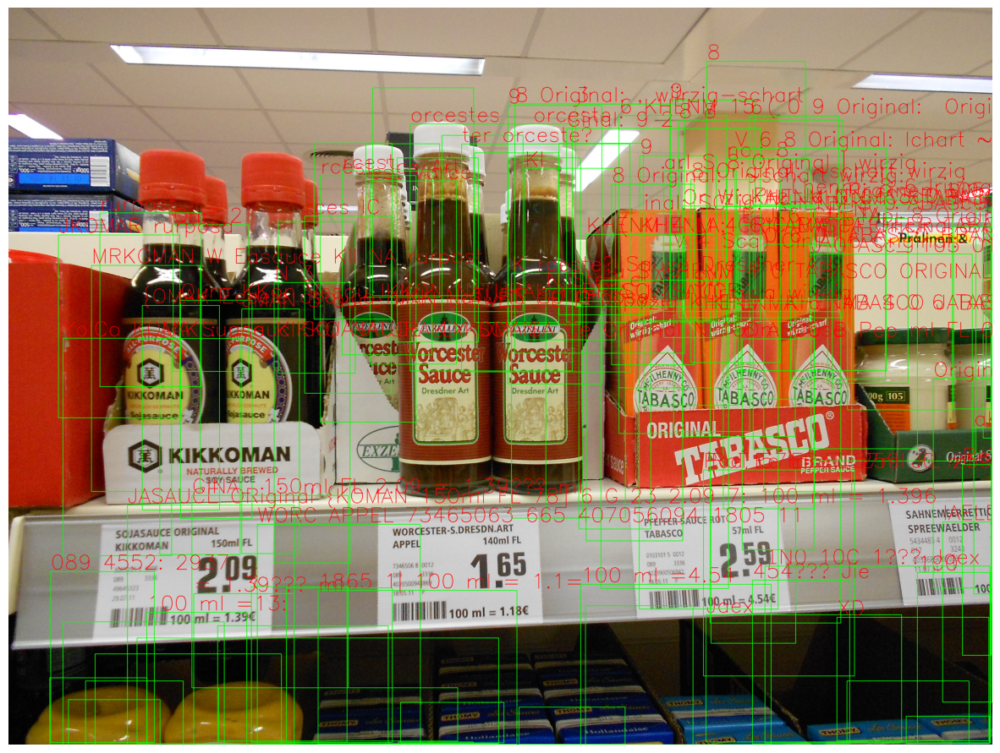

In [ ]:
visualize_all_ocr_results("./data/sample_test_image.jpg", ocr_results)


In [ ]:
import easyocr
import numpy as np
from PIL import Image
import cv2

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])  # Specify language(s) for OCR

def detect_and_recognize_with_easyocr(model, image_path, confidence_threshold=0.5):
    """
    Detect objects using the model and recognize text with EasyOCR.
    Args:
        model: Trained object detection model.
        image_path: Path to the input image.
        confidence_threshold: Minimum confidence for filtering detections.
    Returns:
        List of detected bounding boxes with recognized text.
    """
    # Load image
    img = Image.open(image_path).convert("RGB")
    transform = torchvision.transforms.ToTensor()
    img_tensor = transform(img).to(device)

    # Perform inference
    model.eval()
    with torch.no_grad():
        predictions = model([img_tensor])

    # Convert image to OpenCV format for cropping
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    recognized_items = []

    # Process each detected bounding box
    for box, score in zip(predictions[0]['boxes'], predictions[0]['scores']):
        if score > confidence_threshold:  # Filter by confidence
            x1, y1, x2, y2 = map(int, box.tolist())
            crop = img_cv[y1:y2, x1:x2]  # Crop the region

            # Apply EasyOCR to the cropped region
            ocr_results = reader.readtext(crop, detail=1)
            text = " ".join([res[1] for res in ocr_results])  # Combine detected text

            # Append results
            recognized_items.append({
                "bounding_box": (x1, y1, x2, y2),
                "text": text,
                "confidence": score.item()
            })

    return recognized_items

# Example usage
image_path = "./data/sample_test_image.jpg"
results = detect_and_recognize_with_easyocr(model, image_path, confidence_threshold=0.1)
print("OCR Results:", results)


OCR Results: [{'bounding_box': (1184, 940, 1522, 1607), 'text': '', 'confidence': 0.26466256380081177}, {'bounding_box': (338, 2960, 767, 3240), 'text': '', 'confidence': 0.2518633306026459}, {'bounding_box': (1587, 762, 1967, 1567), 'text': 'est Vorce', 'confidence': 0.234566330909729}, {'bounding_box': (181, 2946, 608, 3240), 'text': '', 'confidence': 0.22360894083976746}, {'bounding_box': (723, 954, 1055, 1599), 'text': 'Qurf 2', 'confidence': 0.21897032856941223}, {'bounding_box': (2789, 897, 3204, 1748), 'text': 'inal: SC ig: KHENM 8 0 ABAScO 9 Original: | ~Schart wiirzig: TDE Kus MCIL VRY Tstzrd TAB', 'confidence': 0.21080225706100464}, {'bounding_box': (1300, 916, 1680, 1695), 'text': 'rces IC', 'confidence': 0.20869331061840057}, {'bounding_box': (1369, 738, 1789, 1822), 'text': "rcest 'Ice Art", 'confidence': 0.2086595892906189}, {'bounding_box': (3216, 953, 3616, 1721), 'text': 'E J 6 Cfn TApi 8 Original: Jart ~schart wirzig- Bu; Ennp ANm Lam', 'confidence': 0.199623629450798

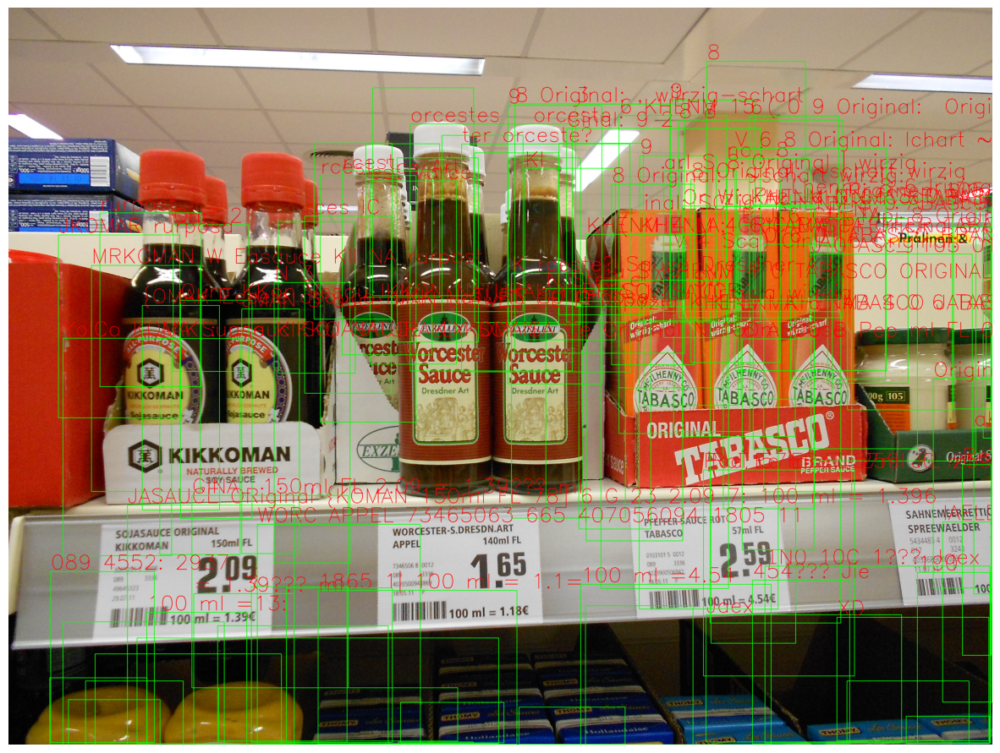

In [ ]:
visualize_all_ocr_results(image_path, results)


OCR Results: [{'bounding_box': (1184, 940, 1522, 1607), 'text': '', 'confidence': 0.26466256380081177}, {'bounding_box': (338, 2960, 767, 3240), 'text': '', 'confidence': 0.2518633306026459}, {'bounding_box': (1587, 762, 1967, 1567), 'text': 'est Vorce', 'confidence': 0.234566330909729}, {'bounding_box': (723, 954, 1055, 1599), 'text': 'Qurf 2', 'confidence': 0.21897032856941223}, {'bounding_box': (2789, 897, 3204, 1748), 'text': 'inal: SC ig: KHENM 8 0 ABAScO 9 Original: | ~Schart wiirzig: TDE Kus MCIL VRY Tstzrd TAB', 'confidence': 0.21080225706100464}, {'bounding_box': (1369, 738, 1789, 1822), 'text': "rcest 'Ice Art", 'confidence': 0.2086595892906189}, {'bounding_box': (3216, 953, 3616, 1721), 'text': 'E J 6 Cfn TApi 8 Original: Jart ~schart wirzig- Bu; Ennp ANm Lam', 'confidence': 0.19962362945079803}, {'bounding_box': (1989, 599, 2728, 1601), 'text': 'ter orceste?', 'confidence': 0.19763626158237457}, {'bounding_box': (3596, 927, 3949, 1651), 'text': 'P Ny', 'confidence': 0.19517

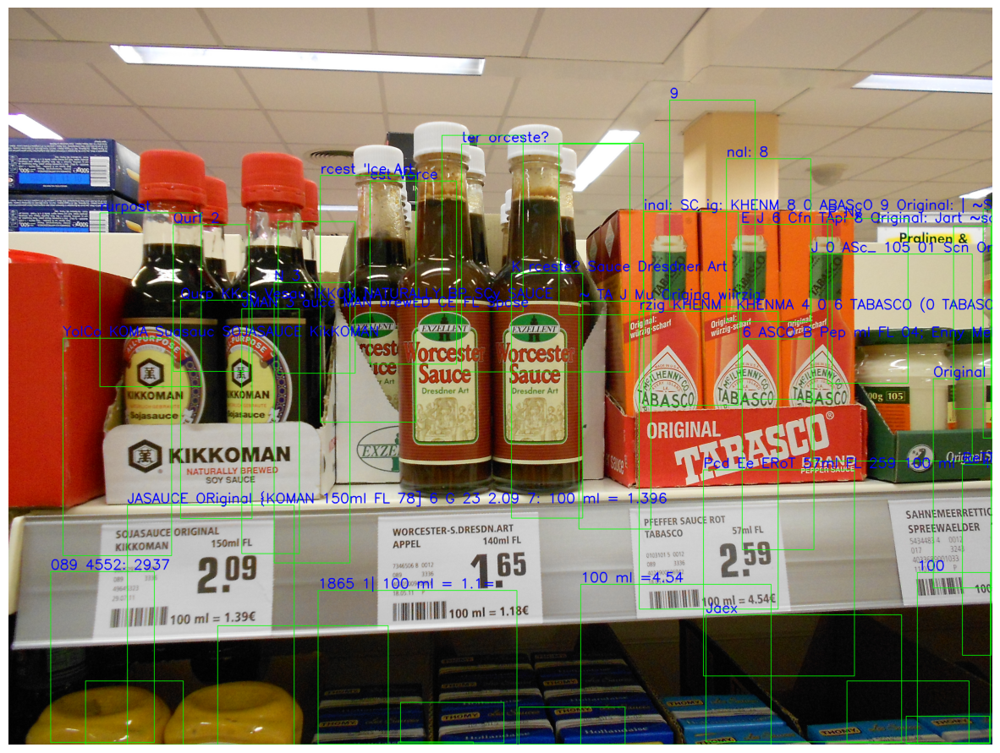

In [ ]:
import easyocr
import numpy as np
from PIL import Image
import cv2
import torch
from torchvision.ops import nms  # Import NMS

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])  # Specify language(s) for OCR

import matplotlib.pyplot as plt
import cv2

def visualize_all_ocr_results(image_path, ocr_results):
    """
    Visualize the detected bounding boxes and their OCR text results on the image.
    """
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for visualization

    # Draw bounding boxes and text
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        x1, y1, x2, y2 = box

        # Draw the bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Overlay OCR text with increased font size and thickness
        cv2.putText(
            img, text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=2.0,  # Increased font scale
            color=(0, 0, 255),
            thickness=4  # Increased thickness
        )

    # Display the image with all OCR results
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

def detect_and_recognize_with_easyocr_nms(model, image_path, confidence_threshold=0.1, iou_threshold=0.5):
    """
    Detect objects using the model, apply NMS, and recognize text with EasyOCR.
    Args:
        model: Trained object detection model.
        image_path: Path to the input image.
        confidence_threshold: Minimum confidence for filtering detections.
        iou_threshold: IOU threshold for NMS.
    Returns:
        List of detected bounding boxes with recognized text.
    """
    # Load image
    img = Image.open(image_path).convert("RGB")
    transform = torchvision.transforms.ToTensor()
    img_tensor = transform(img).to(device)

    # Perform inference
    model.eval()
    with torch.no_grad():
        predictions = model([img_tensor])

    # Extract boxes, scores, and labels
    boxes = predictions[0]['boxes']
    scores = predictions[0]['scores']
    labels = predictions[0]['labels']

    # Filter low-confidence detections
    keep = scores > confidence_threshold
    boxes = boxes[keep]
    scores = scores[keep]
    labels = labels[keep]

    # Apply NMS
    nms_indices = nms(boxes, scores, iou_threshold)
    boxes = boxes[nms_indices]
    scores = scores[nms_indices]
    labels = labels[nms_indices]

    # Convert image to OpenCV format for cropping
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    recognized_items = []

    # Process each filtered bounding box
    for box, score in zip(boxes, scores):
        x1, y1, x2, y2 = map(int, box.tolist())
        crop = img_cv[y1:y2, x1:x2]  # Crop the region

        # Apply EasyOCR to the cropped region
        ocr_results = reader.readtext(crop, detail=1)
        text = " ".join([res[1] for res in ocr_results])  # Combine detected text

        # Append results
        recognized_items.append({
            "bounding_box": (x1, y1, x2, y2),
            "text": text,
            "confidence": score.item()
        })

    return recognized_items

# Example usage
image_path = "./data/sample_test_image.jpg"
results = detect_and_recognize_with_easyocr_nms(model, image_path, confidence_threshold=0.1, iou_threshold=0.3)
print("OCR Results:", results)

visualize_all_ocr_results(image_path, results)


OCR Results: [{'bounding_box': (1587, 762, 1967, 1567), 'text': 'est Vorce', 'confidence': 0.234566330909729}, {'bounding_box': (2789, 897, 3204, 1748), 'text': 'inal: SC 0 Original: | ~Schart TAB', 'confidence': 0.21080225706100464}, {'bounding_box': (1369, 738, 1789, 1822), 'text': "rcest 'Ice", 'confidence': 0.2086595892906189}, {'bounding_box': (3216, 953, 3616, 1721), 'text': 'E 6 Original: Jart ~schart', 'confidence': 0.19962362945079803}, {'bounding_box': (1989, 599, 2728, 1601), 'text': 'orceste?', 'confidence': 0.19763626158237457}, {'bounding_box': (3596, 927, 3949, 1651), 'text': 'P', 'confidence': 0.19517399370670319}, {'bounding_box': (1166, 1208, 1499, 2441), 'text': 'N', 'confidence': 0.1947632133960724}, {'bounding_box': (522, 2187, 1254, 3240), 'text': '150ml FL 2.09', 'confidence': 0.18541409075260162}, {'bounding_box': (2504, 1291, 2820, 2292), 'text': 'TA Origina wiirzig', 'confidence': 0.18204227089881897}, {'bounding_box': (239, 1453, 716, 2409), 'text': 'SOJASAUC

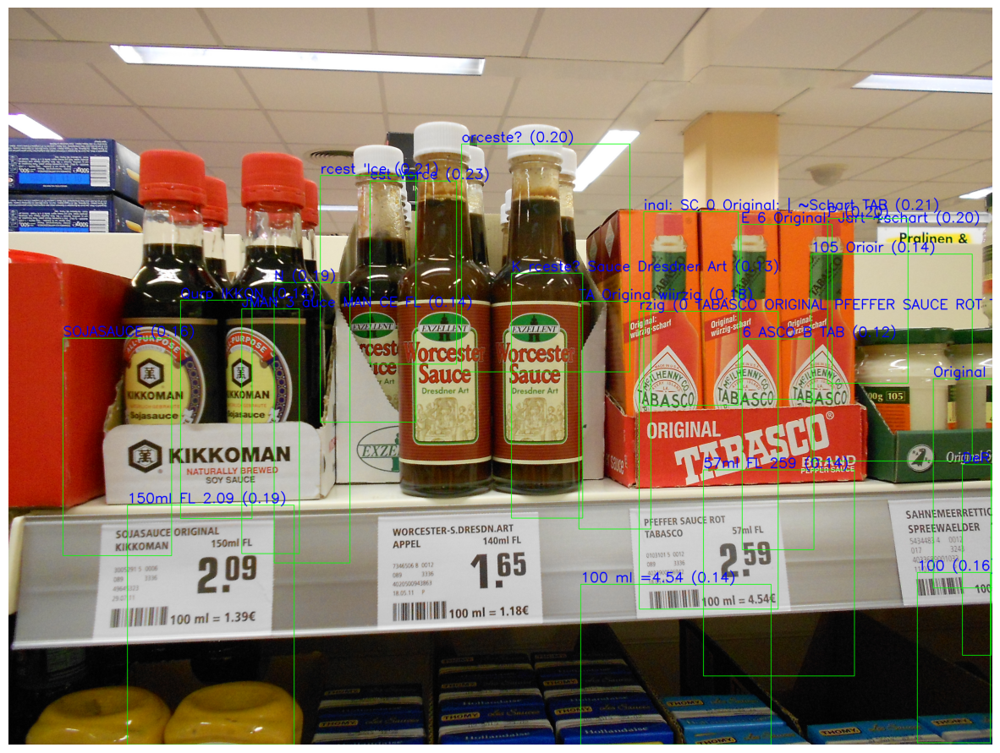

In [ ]:
import easyocr
import numpy as np
from PIL import Image
import cv2
import torch
from torchvision.ops import nms  # Import NMS
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])  # Specify language(s) for OCR

def visualize_all_ocr_results(image_path, ocr_results):
    """
    Visualize the detected bounding boxes and their OCR text results on the image.
    """
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for visualization

    # Draw bounding boxes and text
    for result in ocr_results:
        box = result['bounding_box']
        text = result['text']
        confidence = result['confidence']
        x1, y1, x2, y2 = box

        # Draw the bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Overlay OCR text with increased font size and thickness
        cv2.putText(
            img, f"{text.strip()} ({confidence:.2f})", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=2.0,  # Increased font scale
            color=(0, 0, 255),
            thickness=4  # Increased thickness
        )

    # Display the image with all OCR results
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

def detect_and_recognize_with_easyocr_nms(model, image_path, confidence_threshold=0.3, iou_threshold=0.3, ocr_confidence_threshold=0.5):
    """
    Detect objects using the model, apply NMS, and recognize text with EasyOCR.
    Args:
        model: Trained object detection model.
        image_path: Path to the input image.
        confidence_threshold: Minimum confidence for filtering detections.
        iou_threshold: IOU threshold for NMS.
        ocr_confidence_threshold: Minimum OCR confidence to filter noisy results.
    Returns:
        List of detected bounding boxes with recognized text.
    """
    # Load image
    img = Image.open(image_path).convert("RGB")
    transform = transforms.ToTensor()
    img_tensor = transform(img).to(device)

    # Perform inference
    model.eval()
    with torch.no_grad():
        predictions = model([img_tensor])

    # Extract boxes, scores, and labels
    boxes = predictions[0]['boxes']
    scores = predictions[0]['scores']
    labels = predictions[0]['labels']

    # Filter low-confidence detections
    keep = scores > confidence_threshold
    boxes = boxes[keep]
    scores = scores[keep]
    labels = labels[keep]

    # Apply NMS
    nms_indices = nms(boxes, scores, iou_threshold)
    boxes = boxes[nms_indices]
    scores = scores[nms_indices]
    labels = labels[nms_indices]

    # Convert image to OpenCV format for cropping
    img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    recognized_items = []

    # Process each filtered bounding box
    for box, score in zip(boxes, scores):
        x1, y1, x2, y2 = map(int, box.tolist())
        crop = img_cv[y1:y2, x1:x2]  # Crop the region

        # Apply EasyOCR to the cropped region
        ocr_results = reader.readtext(crop, detail=1)
        filtered_text = []
        for res in ocr_results:
            if res[2] > ocr_confidence_threshold:  # Filter OCR results by confidence
                filtered_text.append(res[1])
        text = " ".join(filtered_text)  # Combine detected text

        # Append results if OCR detected valid text
        if text.strip():
            recognized_items.append({
                "bounding_box": (x1, y1, x2, y2),
                "text": text,
                "confidence": score.item()
            })

    return recognized_items

# Example usage
image_path = "./data/sample_test_image.jpg"
results = detect_and_recognize_with_easyocr_nms(
    model,
    image_path,
    confidence_threshold=0.1,  # Filter model detections
    iou_threshold=0.3,         # Reduce overlapping boxes
    ocr_confidence_threshold=0.6  # Filter noisy OCR text
)

print("OCR Results:", results)
visualize_all_ocr_results(image_path, results)
